In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy


sc.settings.verbosity = 3         # verbosity: errors (0), warnings (1), info (2), hints (3)
# gives error!! sc.logging.print_versions()

import warnings
warnings.filterwarnings('ignore')

sc.settings.set_figure_params(dpi=80)

In [2]:
adata = sc.read_h5ad('./data/h5ab_folder/gse159812_raw_covid.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 121622 × 36601
    obs: 'sample', 'batch'
    var: 'gene_id'

In [4]:
adata.obs

,sample,batch
AAACCCAAGGCTTTCA,COVID-19_1,0
AAACCCACAGGTATGG,COVID-19_1,0
AAACCCATCGAGTACT,COVID-19_1,0
AAACCCATCGTGGTAT,COVID-19_1,0
AAACGAAAGAAGAACG,COVID-19_1,0
...,...,...
TTTGGTTCACAACGCC,COVID-19_15,29
TTTGGTTGTACAAGCG,COVID-19_15,29
TTTGTTGAGCCGTAAG,COVID-19_15,29
TTTGTTGCAAGCGGAT,COVID-19_15,29


In [5]:
adata.var

,gene_id
gene_symbol,
MIR1302-2HG,ENSG00000243485
FAM138A,ENSG00000237613
OR4F5,ENSG00000186092
AL627309.1,ENSG00000238009
AL627309.3,ENSG00000239945
...,...
AC141272.1,ENSG00000277836
AC023491.2,ENSG00000278633
AC007325.1,ENSG00000276017


In [6]:
print(adata.obs['sample'].value_counts())

COVID-19_9     6825
Control_12     6806
COVID-19_1     6685
COVID-19_11    6012
COVID-19_8     5994
COVID-19_3     5906
COVID-19_7     5027
Control_2      4885
Control_9      4635
COVID-19_4     4589
Influenza_2    4460
COVID-19_12    4395
Control_10     4301
Control_13     4239
Control_6      4176
Control_11     3908
COVID-19_5     3771
COVID-19_15    3681
Control_8      3579
Control_7      3362
COVID-19_14    3125
Control_5      2998
Influenza_1    2833
Control_4      2817
Control_1      2530
COVID-19_2     2443
Control_3      2341
COVID-19_6     2131
COVID-19_10    1787
COVID-19_13    1381
Name: sample, dtype: int64


In [7]:
# mitochondrial genes
adata.var['mt'] = adata.var_names.str.startswith('MT-') 
# ribosomal genes
adata.var['ribo'] = adata.var_names.str.startswith(("RPS","RPL"))
# hemoglobin genes.
adata.var['hb'] = adata.var_names.str.contains(("^HB[^(P)]"))

adata.var

,gene_id,mt,ribo,hb
gene_symbol,,,,
MIR1302-2HG,ENSG00000243485,False,False,False
FAM138A,ENSG00000237613,False,False,False
OR4F5,ENSG00000186092,False,False,False
AL627309.1,ENSG00000238009,False,False,False
AL627309.3,ENSG00000239945,False,False,False
...,...,...,...,...
AC141272.1,ENSG00000277836,False,False,False
AC023491.2,ENSG00000278633,False,False,False
AC007325.1,ENSG00000276017,False,False,False


In [8]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo','hb'], percent_top=None, log1p=False, inplace=True)

In [9]:
adata.obs

,sample,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb
AAACCCAAGGCTTTCA,COVID-19_1,0,2089,3665.0,1.0,0.027285,11.0,0.300136,0.0,0.000000
AAACCCACAGGTATGG,COVID-19_1,0,1716,3132.0,1.0,0.031928,8.0,0.255428,0.0,0.000000
AAACCCATCGAGTACT,COVID-19_1,0,4228,9130.0,37.0,0.405257,34.0,0.372399,2.0,0.021906
AAACCCATCGTGGTAT,COVID-19_1,0,479,563.0,0.0,0.000000,4.0,0.710480,0.0,0.000000
AAACGAAAGAAGAACG,COVID-19_1,0,2468,4163.0,8.0,0.192169,35.0,0.840740,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...
TTTGGTTCACAACGCC,COVID-19_15,29,3667,8992.0,181.0,2.012900,86.0,0.956406,2.0,0.022242
TTTGGTTGTACAAGCG,COVID-19_15,29,602,856.0,51.0,5.957944,6.0,0.700935,0.0,0.000000
TTTGTTGAGCCGTAAG,COVID-19_15,29,958,1469.0,131.0,8.917631,4.0,0.272294,1.0,0.068074
TTTGTTGCAAGCGGAT,COVID-19_15,29,2297,5004.0,800.0,15.987210,35.0,0.699440,0.0,0.000000


In [10]:
# Check whethe the matrix: adata.X is sparse or not.
scipy.sparse.issparse(adata.X)

False

In [11]:
mito_genes = adata.var_names.str.startswith('MT-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
# adata.obs['percent_mt2'] = np.sum(
#     adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# # add the total counts per cell as observations-annotation to adata
# adata.obs['n_counts'] = adata.X.sum(axis=1).A1


adata.obs['percent_mt2'] = np.sum(
    adata[:, mito_genes].X, axis=1) / np.sum(adata.X, axis=1)
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1)

In [12]:
adata

AnnData object with n_obs × n_vars = 121622 × 36601
    obs: 'sample', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts'
    var: 'gene_id', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [13]:
sc.set_figure_params(figsize=(14, 8))

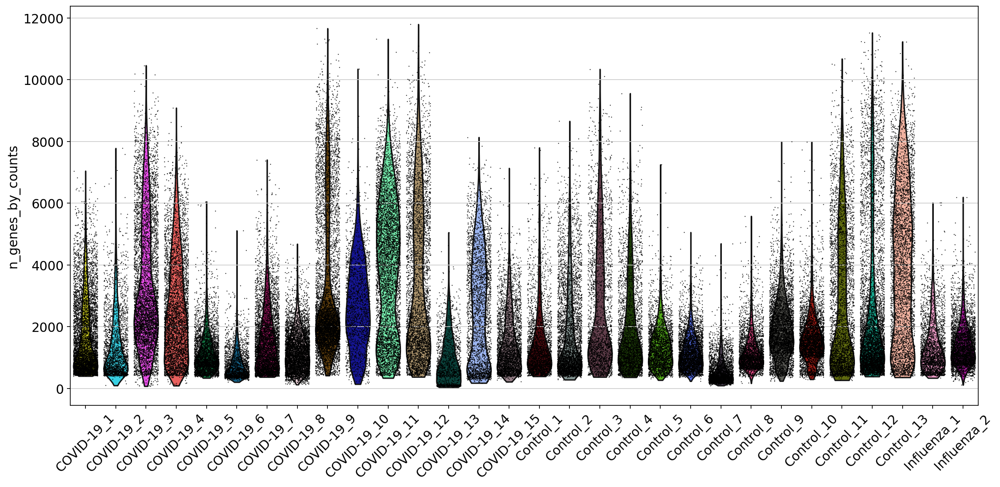

In [14]:
sc.pl.violin(adata, ['n_genes_by_counts'],
             jitter=0.4, groupby = 'sample', rotation= 45)

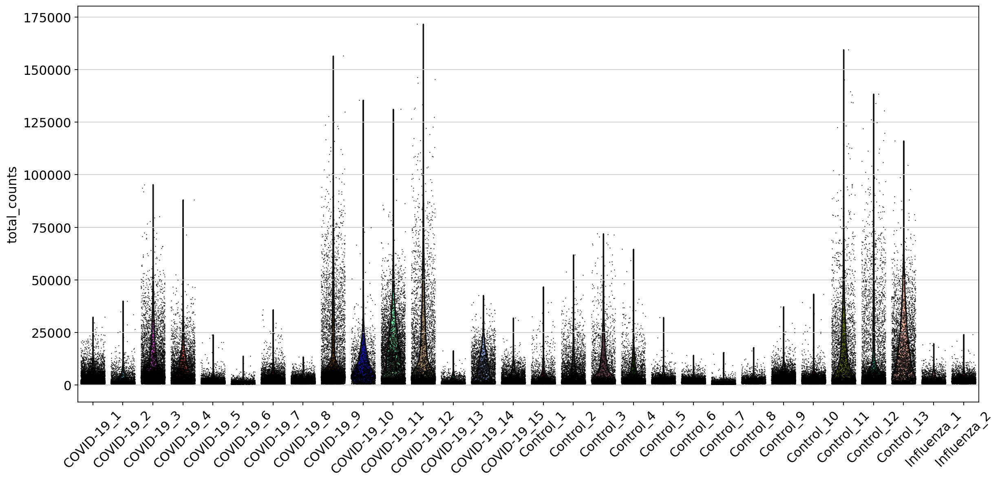

In [15]:
sc.pl.violin(adata, ['total_counts'],
             jitter=0.4, groupby = 'sample', rotation= 45)

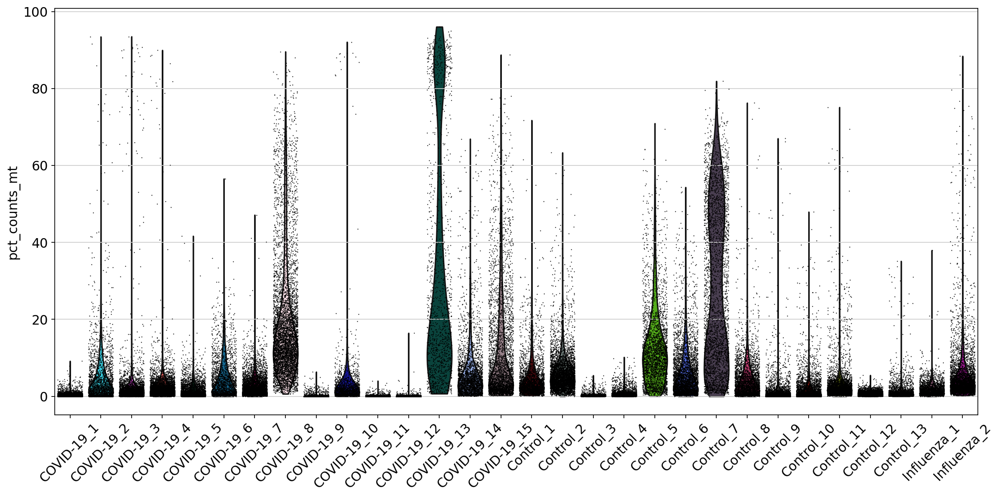

In [16]:
sc.pl.violin(adata, ['pct_counts_mt'],
             jitter=0.4, groupby = 'sample', rotation= 45)

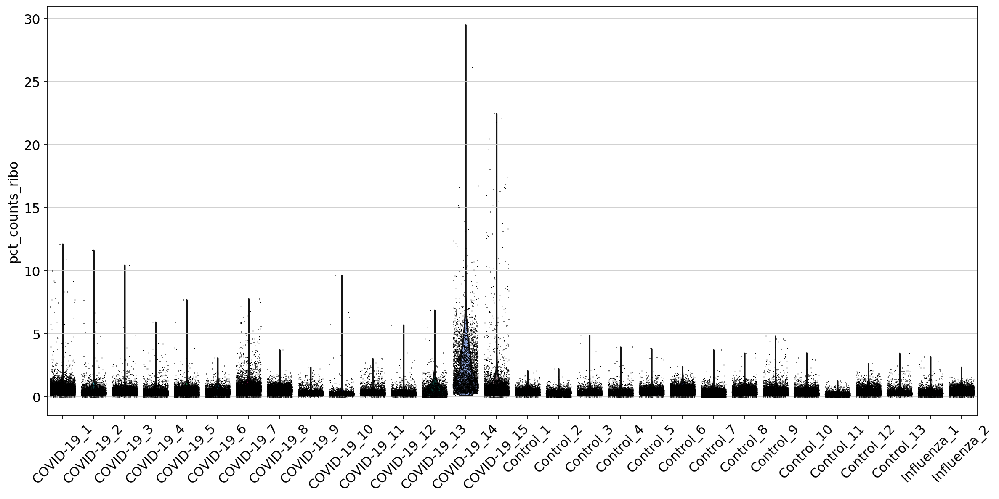

In [17]:
sc.pl.violin(adata, ['pct_counts_ribo'],
             jitter=0.4, groupby = 'sample', rotation= 45)

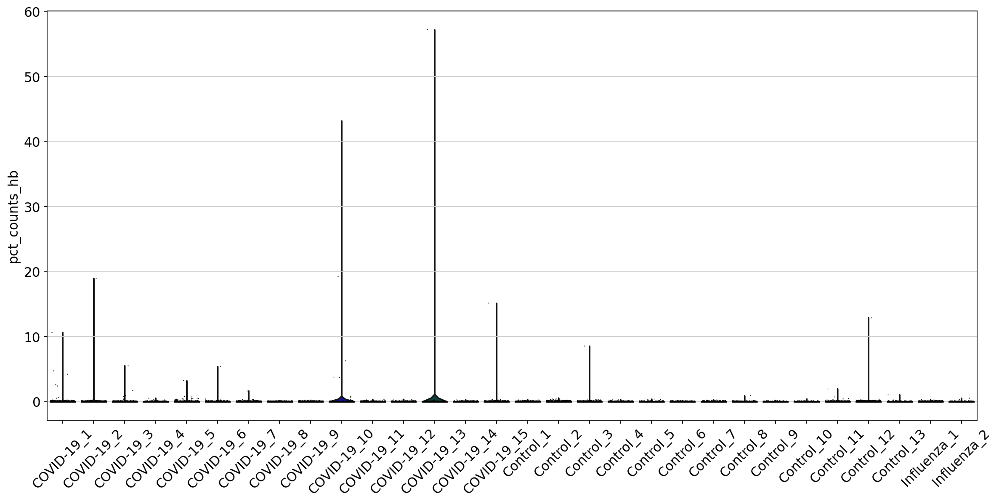

In [18]:
sc.pl.violin(adata, ['pct_counts_hb'],
             jitter=0.4, groupby = 'sample', rotation= 45)

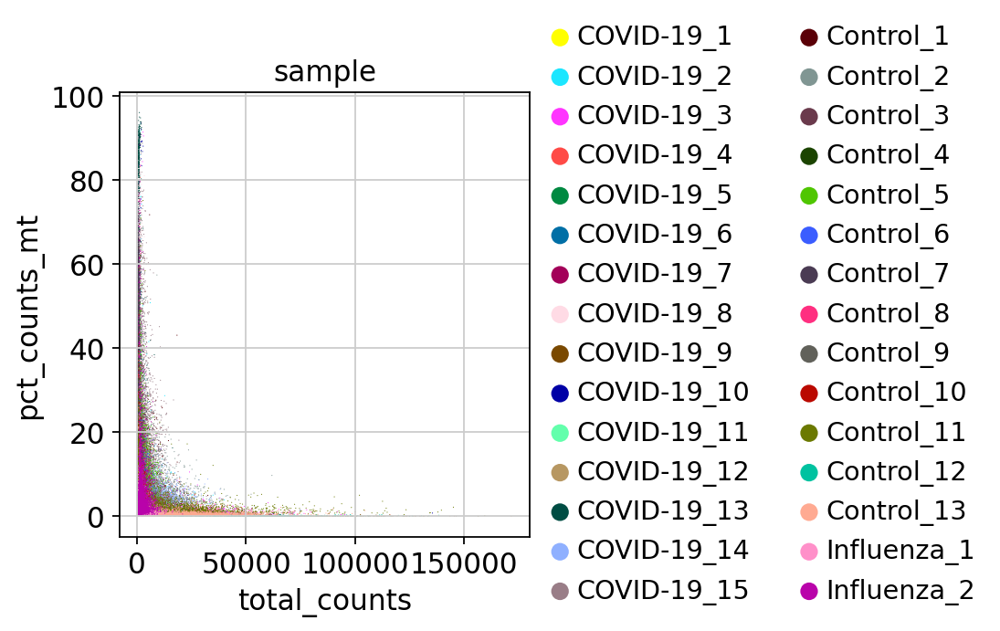

In [19]:
sc.set_figure_params(figsize=None)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color="sample")


In [20]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

print(adata.n_obs, adata.n_vars)

filtered out 561 cells that have less than 200 genes expressed
filtered out 4779 genes that are detected in less than 3 cells
121061 31822


normalizing counts per cell
    finished (0:00:02)


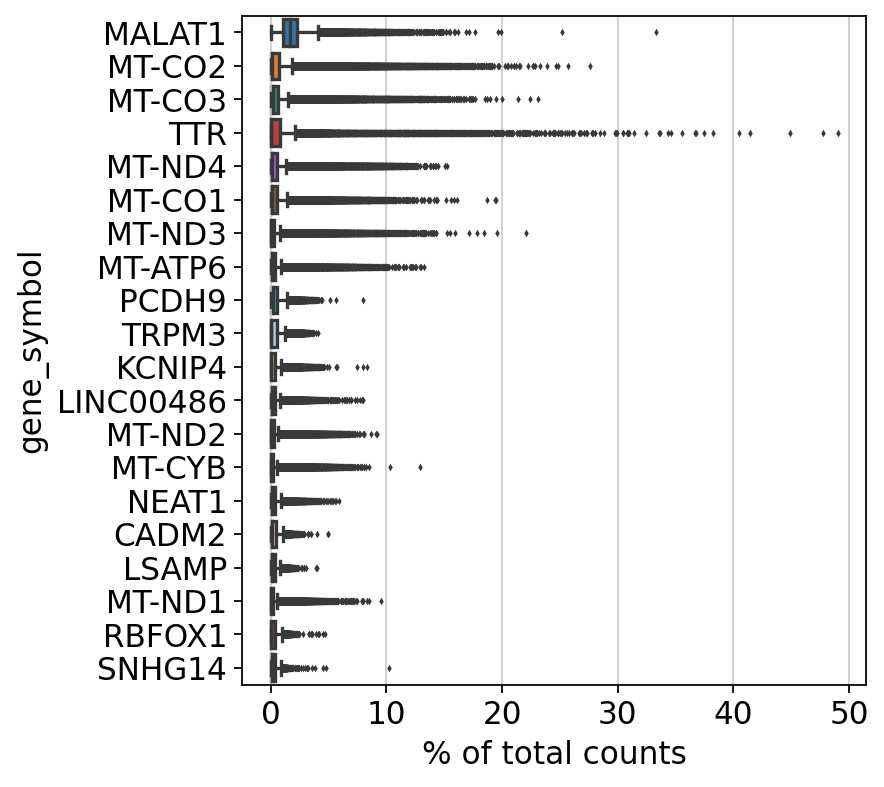

In [21]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [22]:
print(len(adata[adata.obs['pct_counts_mt'] < 20, :]))
print(len(adata[adata.obs['pct_counts_ribo'] > 5, :]))
#114701
#7280

114701
385


In [23]:
# filter for percent mito
adata = adata[adata.obs['pct_counts_mt'] < 20, :]

# Don't filter by the percent of ribosome
# filter for percent ribo > 0.05
#adata = adata[adata.obs['pct_counts_ribo'] > 5, :]

print("Remaining cells %d"%adata.n_obs)

Remaining cells 114701


In [24]:
print(adata.obs['sample'].value_counts())

COVID-19_9     6825
Control_12     6806
COVID-19_1     6685
COVID-19_11    6012
COVID-19_3     5849
COVID-19_7     5019
Control_2      4748
Control_9      4608
COVID-19_4     4561
COVID-19_12    4395
Influenza_2    4278
Control_10     4261
Control_13     4218
COVID-19_8     4161
Control_6      3994
Control_11     3817
COVID-19_5     3767
Control_8      3517
COVID-19_14    2947
COVID-19_15    2926
Influenza_1    2829
Control_4      2817
Control_5      2485
Control_1      2458
COVID-19_2     2359
Control_3      2341
COVID-19_6     2083
COVID-19_10    1766
Control_7      1485
COVID-19_13     684
Name: sample, dtype: int64


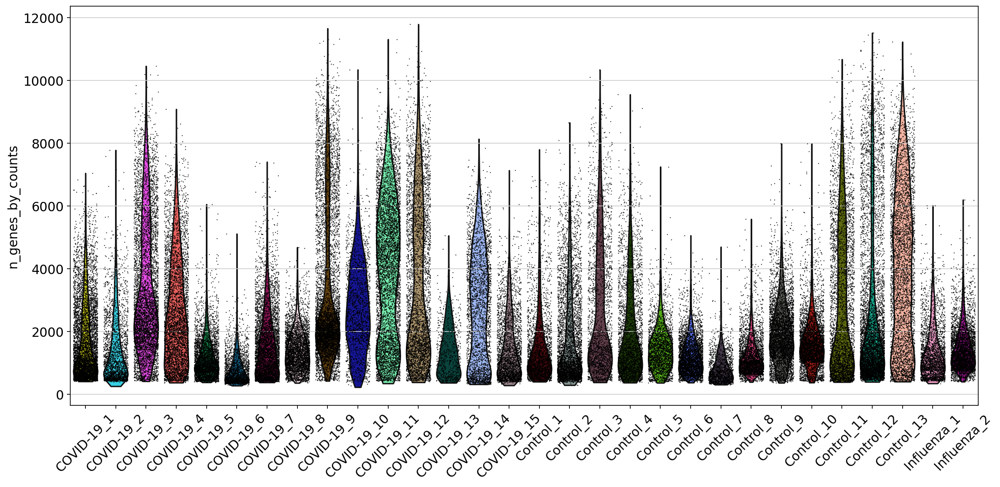

In [25]:
sc.set_figure_params(figsize=(14, 8))
sc.pl.violin(adata, ['n_genes_by_counts'],
             jitter=0.4, groupby = 'sample', rotation= 45)

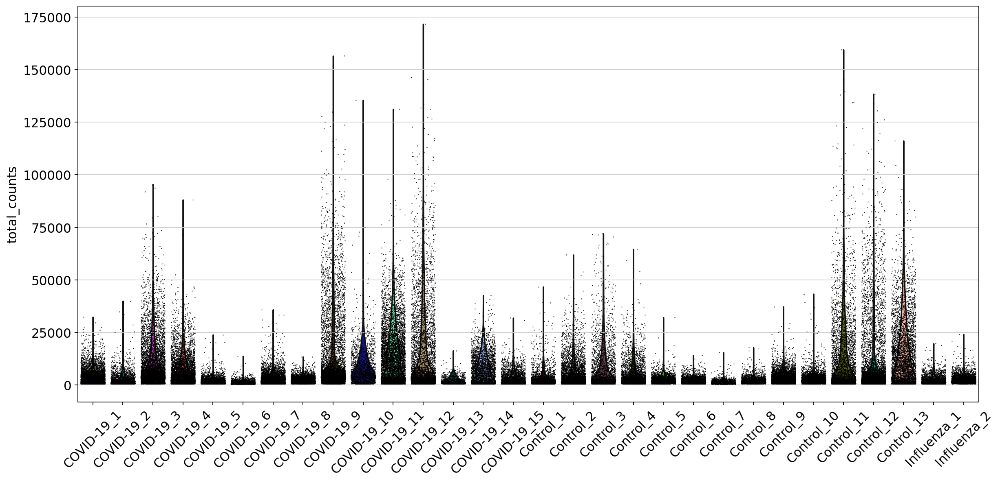

In [26]:
sc.pl.violin(adata, ['total_counts'],
             jitter=0.4, groupby = 'sample', rotation= 45)

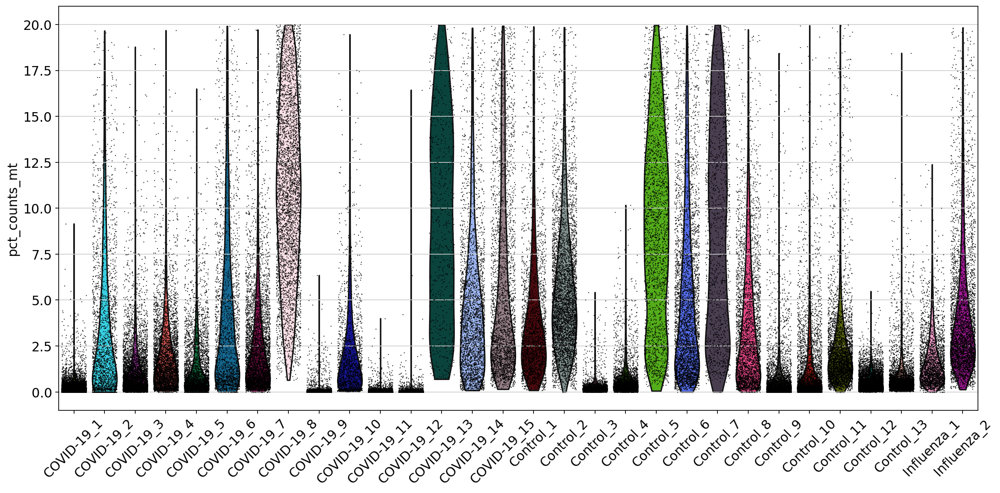

In [27]:
sc.pl.violin(adata, ['pct_counts_mt'],
             jitter=0.4, groupby = 'sample', rotation= 45)

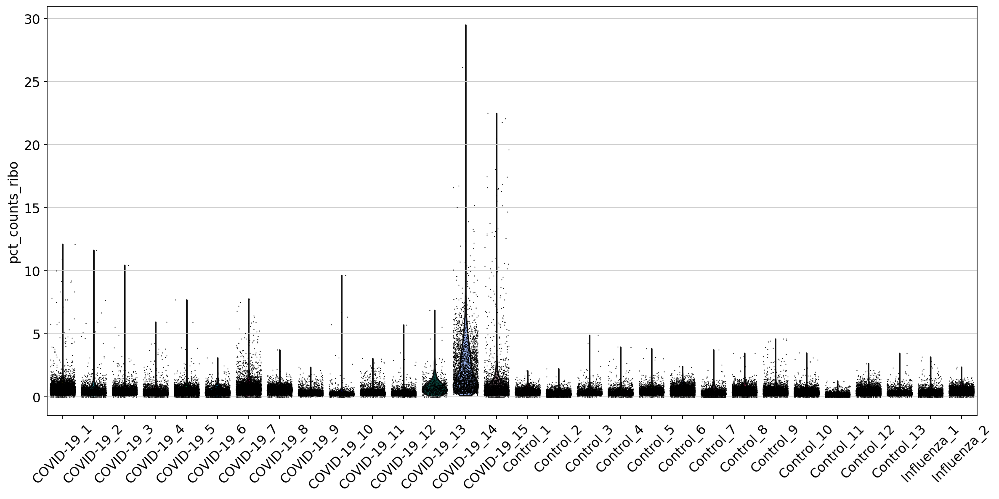

In [28]:
sc.pl.violin(adata, ['pct_counts_ribo'],
             jitter=0.4, groupby = 'sample', rotation= 45)

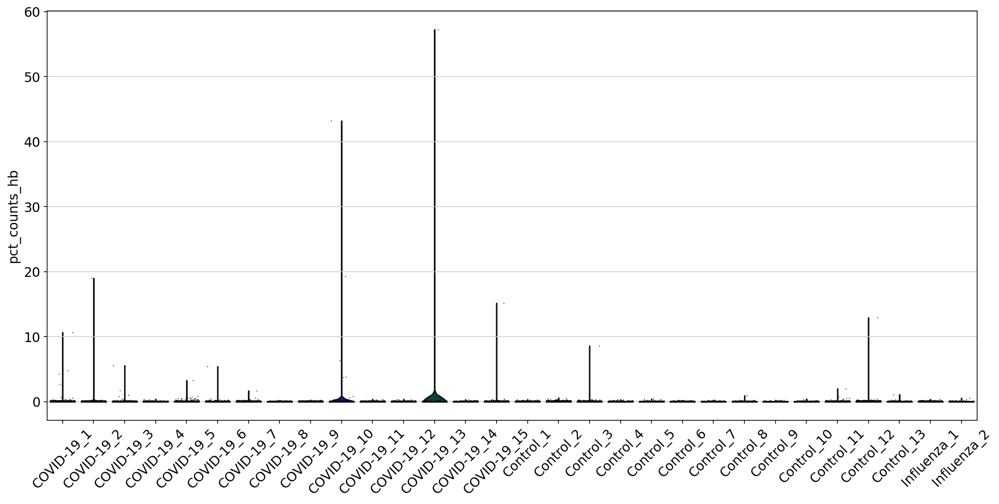

In [31]:
sc.pl.violin(adata, ['pct_counts_hb'],
             jitter=0.4, groupby = 'sample', rotation= 45)

In [30]:
malat1 = adata.var_names.str.startswith('MALAT1')
# we need to redefine the mito_genes since they were first 
# calculated on the full object before removing low expressed genes.
mito_genes = adata.var_names.str.startswith('MT-')
hb_genes = adata.var_names.str.contains('^HB[^(P)]')

remove = np.add(mito_genes, malat1)
remove = np.add(remove, hb_genes)
keep = np.invert(remove)

adata = adata[:,keep]

print(adata.n_obs, adata.n_vars)

114701 31797


In [ ]:
annot = sc.queries.biomart_annotations(
        "hsapiens",
        ["ensembl_gene_id", "external_gene_name", "start_position", "end_position", "chromosome_name"],
    ).set_index("external_gene_name")
#>>> adata.var[annot.columns] = annot

In [ ]:
chrY_genes = adata.var_names.intersection(annot.index[annot.chromosome_name == "Y"])
chrY_genes

Index(['SRY', 'RPS4Y1', 'ZFY', 'ZFY-AS1', 'LINC00278', 'PCDH11Y', 'LINC00280',
       'TTTY2B', 'AMELY', 'TBL1Y', 'PRKY', 'TTTY18', 'TTTY22', 'USP9Y',
       'DDX3Y', 'UTY', 'TMSB4Y', 'NLGN4Y', 'NLGN4Y-AS1', 'FAM224B', 'FAM224A',
       'TTTY9B', 'HSFY2', 'TTTY14', 'KDM5D', 'TTTY10', 'EIF1AY', 'PRORY',
       'TTTY13', 'PRY2', 'PRY', 'TTTY4', 'DAZ1', 'DAZ2', 'TTTY3B', 'TTTY4B',
       'DAZ4', 'TTTY4C', 'TTTY17C'],
      dtype='object')

In [ ]:
adata.obs['percent_chrY'] = (np.sum(
    adata[:, chrY_genes].X, axis=1) / np.sum(adata.X, axis=1) * 100).toarray()

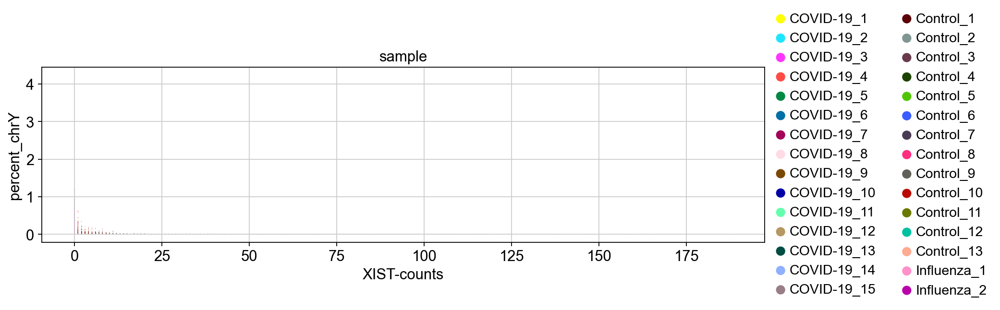

In [ ]:
# color inputs must be from either .obs or .var, so add in XIST expression to obs.
adata.obs["XIST-counts"] = adata.X[:,adata.var_names.str.match('XIST')] # XIST is a gene!

sc.set_figure_params(figsize=(10, 3))
sc.pl.scatter(adata, x='XIST-counts', y='percent_chrY', color="sample")


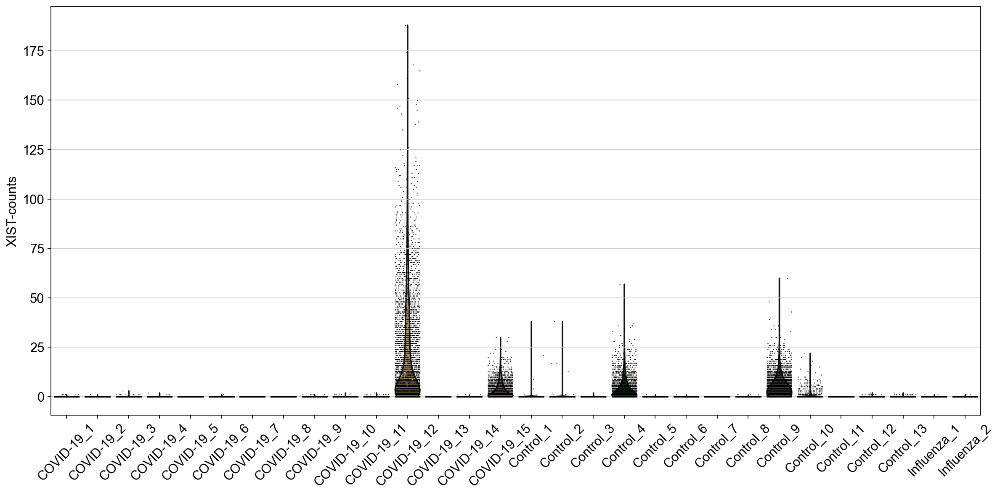

In [ ]:
sc.set_figure_params(figsize=(14, 8))
sc.pl.violin(adata, ["XIST-counts"], jitter=0.4, groupby = 'sample', rotation= 45)

Based on the above plot, there are only 4 females. COVID_19_12, COVID_19_15, Control_4, and Control_9 are female.

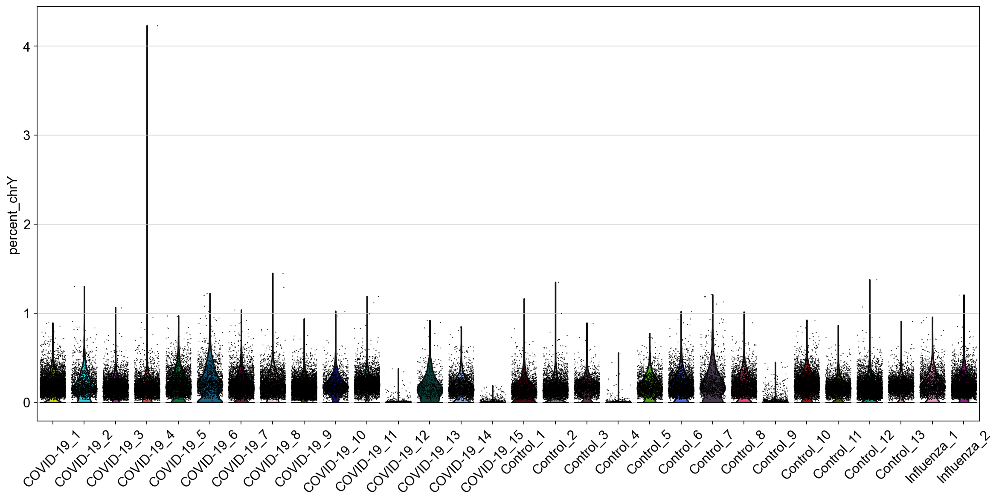

In [ ]:
sc.pl.violin(adata, ["percent_chrY"], jitter=0.4, groupby = 'sample', rotation= 45)

Based on the above plot, most of samples are male (expect for COVID_19_12, COVID_19_15, Control_4, and Control_9).

In [33]:
cell_cycle_genes = [x.strip() for x in open('./data/regev_lab_cell_cycle_genes.txt')]
print(len(cell_cycle_genes))

# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
print(len(cell_cycle_genes))

97
94


In [34]:
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    730 total control genes are used. (0:00:30)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    858 total control genes are used. (0:00:04)
-->     'phase', cell cycle phase (adata.obs)


In [35]:
adata.obs

,sample,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,n_genes,S_score,G2M_score,phase
AAACCCAAGGCTTTCA,COVID-19_1,0,2089,3665.0,1.0,0.027285,11.0,0.300136,0.0,0.000000,NaN,3665.0,2089,-0.041944,0.004079,G2M
AAACCCACAGGTATGG,COVID-19_1,0,1716,3132.0,1.0,0.031928,8.0,0.255428,0.0,0.000000,NaN,3132.0,1716,-0.028245,-0.055944,G1
AAACCCATCGAGTACT,COVID-19_1,0,4228,9130.0,37.0,0.405257,34.0,0.372399,2.0,0.021906,NaN,9130.0,4228,-0.011416,-0.092075,G1
AAACCCATCGTGGTAT,COVID-19_1,0,479,563.0,0.0,0.000000,4.0,0.710480,0.0,0.000000,NaN,563.0,479,-0.021918,-0.012821,G1
AAACGAAAGAAGAACG,COVID-19_1,0,2468,4163.0,8.0,0.192169,35.0,0.840740,0.0,0.000000,NaN,4163.0,2468,0.003457,-0.023310,S
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTCACAACGCC,COVID-19_15,29,3667,8992.0,181.0,2.012900,86.0,0.956406,2.0,0.022242,NaN,8992.0,3667,-0.095173,-0.006410,G1
TTTGGTTGTACAAGCG,COVID-19_15,29,602,856.0,51.0,5.957944,6.0,0.700935,0.0,0.000000,NaN,856.0,602,-0.017808,0.011072,G2M
TTTGTTGAGCCGTAAG,COVID-19_15,29,958,1469.0,131.0,8.917631,4.0,0.272294,1.0,0.068074,NaN,1469.0,958,-0.031507,-0.017483,G1
TTTGTTGCAAGCGGAT,COVID-19_15,29,2297,5004.0,800.0,15.987210,35.0,0.699440,0.0,0.000000,NaN,5004.0,2297,-0.035943,-0.051865,G1


In [36]:
# save normalized counts in raw slot.
adata.raw = adata

# # normalize to depth 10 000
# sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.normalize_total(adata)

# logaritmize
sc.pp.log1p(adata)

# scale
#sc.pp.scale(adata)

normalizing counts per cell
    finished (0:00:00)


In [37]:
# # Save adata
# save_file = './data/h5ab_folder/gse159812_raw_covid_normalized.h5ad'
# adata.write_h5ad(save_file)

## If crash, start from here (checkpoint 1)

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy


sc.settings.verbosity = 3         # verbosity: errors (0), warnings (1), info (2), hints (3)
# gives error!! sc.logging.print_versions()

import warnings
warnings.filterwarnings('ignore')

sc.settings.set_figure_params(dpi=80)

adata = sc.read_h5ad('./data/h5ab_folder/gse159812_raw_covid_normalized.h5ad')
adata.uns['log1p']["base"] = None


In [3]:
adata.obs

,sample,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,n_genes,S_score,G2M_score,phase
AAACCCAAGGCTTTCA,COVID-19_1,0,2089,3665.0,1.0,0.027285,11.0,0.300136,0.0,0.000000,NaN,3665.0,2089,-0.041944,0.004079,G2M
AAACCCACAGGTATGG,COVID-19_1,0,1716,3132.0,1.0,0.031928,8.0,0.255428,0.0,0.000000,NaN,3132.0,1716,-0.028245,-0.055944,G1
AAACCCATCGAGTACT,COVID-19_1,0,4228,9130.0,37.0,0.405257,34.0,0.372399,2.0,0.021906,NaN,9130.0,4228,-0.011416,-0.092075,G1
AAACCCATCGTGGTAT,COVID-19_1,0,479,563.0,0.0,0.000000,4.0,0.710480,0.0,0.000000,NaN,563.0,479,-0.021918,-0.012821,G1
AAACGAAAGAAGAACG,COVID-19_1,0,2468,4163.0,8.0,0.192169,35.0,0.840740,0.0,0.000000,NaN,4163.0,2468,0.003457,-0.023310,S
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTCACAACGCC,COVID-19_15,29,3667,8992.0,181.0,2.012900,86.0,0.956406,2.0,0.022242,NaN,8992.0,3667,-0.095173,-0.006410,G1
TTTGGTTGTACAAGCG,COVID-19_15,29,602,856.0,51.0,5.957944,6.0,0.700935,0.0,0.000000,NaN,856.0,602,-0.017808,0.011072,G2M
TTTGTTGAGCCGTAAG,COVID-19_15,29,958,1469.0,131.0,8.917631,4.0,0.272294,1.0,0.068074,NaN,1469.0,958,-0.031507,-0.017483,G1
TTTGTTGCAAGCGGAT,COVID-19_15,29,2297,5004.0,800.0,15.987210,35.0,0.699440,0.0,0.000000,NaN,5004.0,2297,-0.035943,-0.051865,G1


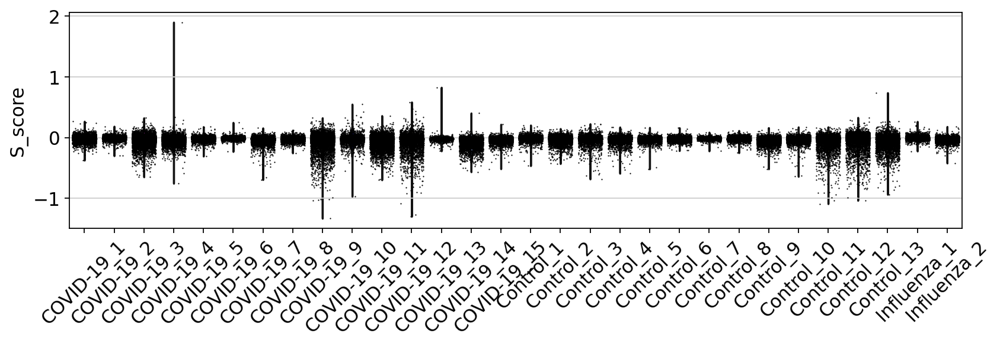

In [41]:
sc.set_figure_params(figsize=(10, 3))
sc.pl.violin(adata, ['S_score'],
             jitter=0.4, groupby = 'sample', rotation=45)

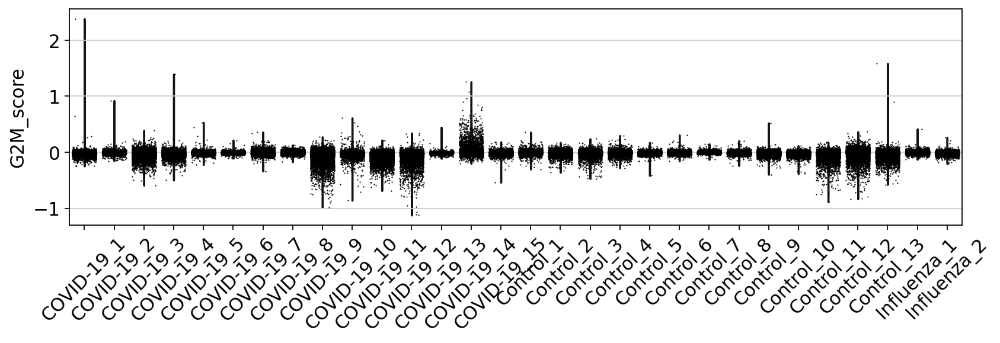

In [42]:
sc.pl.violin(adata, ['G2M_score'],
             jitter=0.4, groupby = 'sample', rotation=45)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.37
Detected doublet rate = 1.5%
Estimated detectable doublet fraction = 38.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 3.8%
Elapsed time: 198.5 seconds


1673

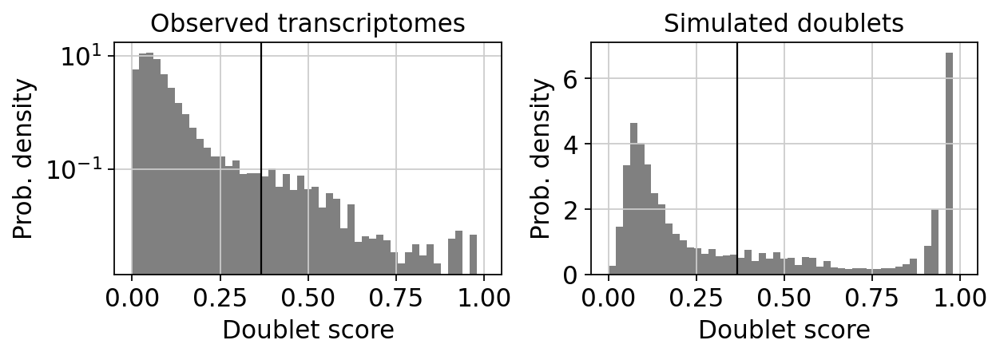

In [38]:
import scrublet as scr
scrub = scr.Scrublet(adata.raw.X)
adata.obs['doublet_scores'], adata.obs['predicted_doublets'] = scrub.scrub_doublets()
scrub.plot_histogram()

sum(adata.obs['predicted_doublets'])

In [39]:
# add in column with singlet/doublet instead of True/False
adata.obs['doublet_info'] = adata.obs["predicted_doublets"].astype(str)

In [40]:
adata.obs

,sample,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,n_genes,S_score,G2M_score,phase,doublet_scores,predicted_doublets,doublet_info
AAACCCAAGGCTTTCA,COVID-19_1,0,2089,3665.0,1.0,0.027285,11.0,0.300136,0.0,0.000000,NaN,3665.0,2089,-0.041944,0.004079,G2M,0.221875,False,False
AAACCCACAGGTATGG,COVID-19_1,0,1716,3132.0,1.0,0.031928,8.0,0.255428,0.0,0.000000,NaN,3132.0,1716,-0.028245,-0.055944,G1,0.018135,False,False
AAACCCATCGAGTACT,COVID-19_1,0,4228,9130.0,37.0,0.405257,34.0,0.372399,2.0,0.021906,NaN,9130.0,4228,-0.011416,-0.092075,G1,0.212274,False,False
AAACCCATCGTGGTAT,COVID-19_1,0,479,563.0,0.0,0.000000,4.0,0.710480,0.0,0.000000,NaN,563.0,479,-0.021918,-0.012821,G1,0.008351,False,False
AAACGAAAGAAGAACG,COVID-19_1,0,2468,4163.0,8.0,0.192169,35.0,0.840740,0.0,0.000000,NaN,4163.0,2468,0.003457,-0.023310,S,0.114469,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTCACAACGCC,COVID-19_15,29,3667,8992.0,181.0,2.012900,86.0,0.956406,2.0,0.022242,NaN,8992.0,3667,-0.095173,-0.006410,G1,0.071136,False,False
TTTGGTTGTACAAGCG,COVID-19_15,29,602,856.0,51.0,5.957944,6.0,0.700935,0.0,0.000000,NaN,856.0,602,-0.017808,0.011072,G2M,0.028046,False,False
TTTGTTGAGCCGTAAG,COVID-19_15,29,958,1469.0,131.0,8.917631,4.0,0.272294,1.0,0.068074,NaN,1469.0,958,-0.031507,-0.017483,G1,0.056483,False,False
TTTGTTGCAAGCGGAT,COVID-19_15,29,2297,5004.0,800.0,15.987210,35.0,0.699440,0.0,0.000000,NaN,5004.0,2297,-0.035943,-0.051865,G1,0.080871,False,False


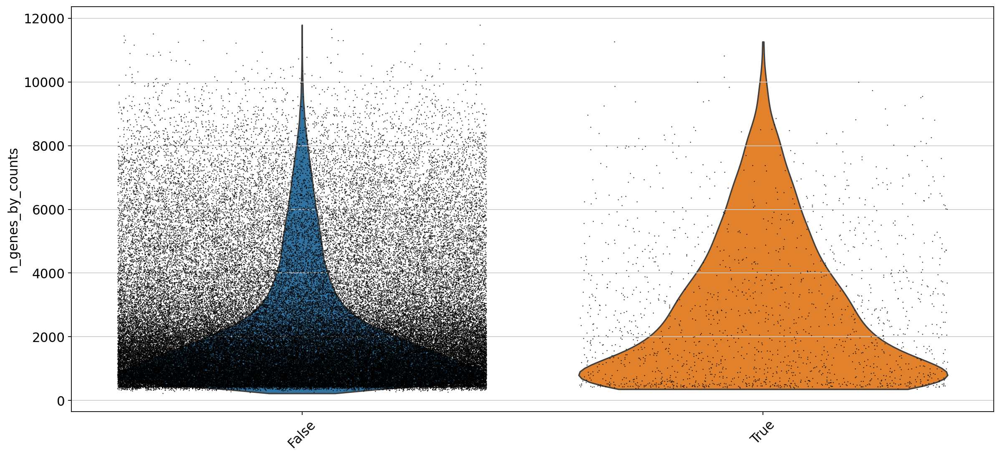

In [41]:
sc.pl.violin(adata, 'n_genes_by_counts',
             jitter=0.4, groupby = 'doublet_info', rotation=45)

In [ ]:
#sc.pp.filter_genes(adata, min_cells=0)

In [42]:

sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:49)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [43]:
adata = adata[:, adata.var.highly_variable]

In [45]:
# # Save adata
# save_file = './data/h5ab_folder/gse159812_raw_covid_normalized_doublet.h5ad'
# adata.write_h5ad(save_file)

In [46]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    finished (0:01:30)


In [47]:
sc.pp.scale(adata, max_value=10)

In [48]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:14)


In [49]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:16)


In [50]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:40)


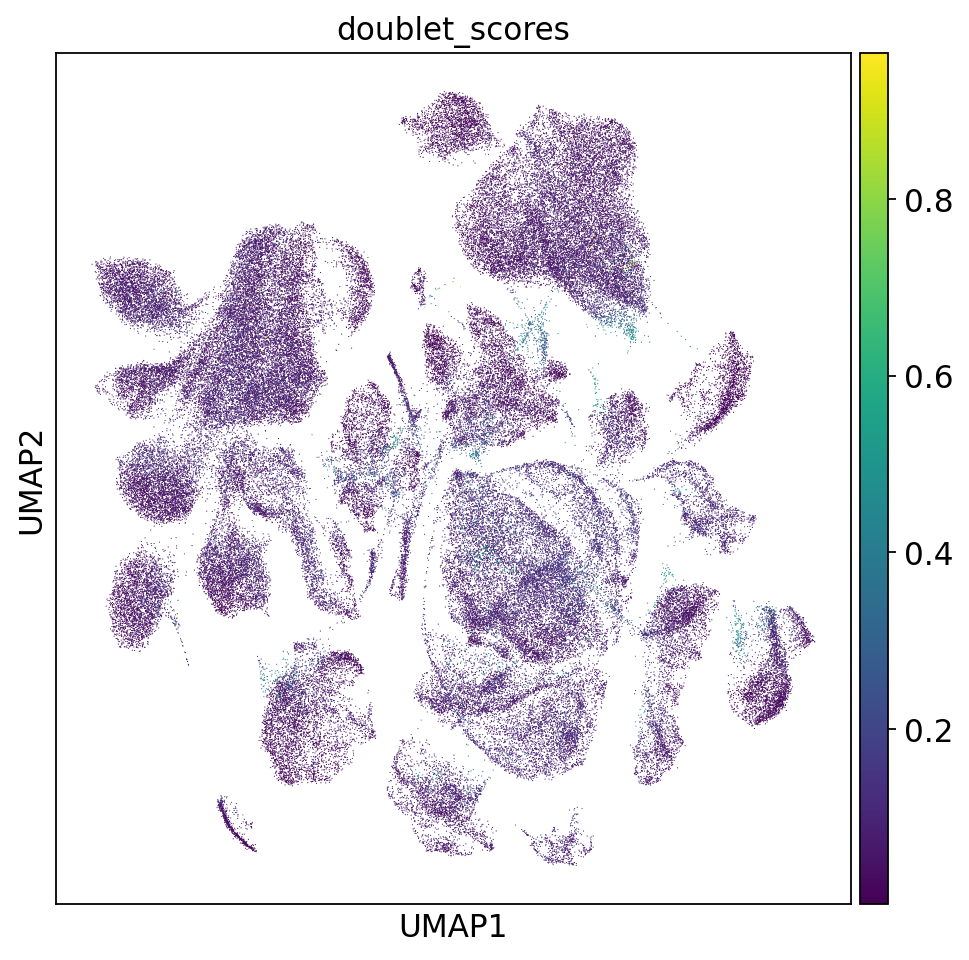

In [56]:
sc.set_figure_params(figsize=(7,7))
sc.pl.umap(adata, color=['doublet_scores'])

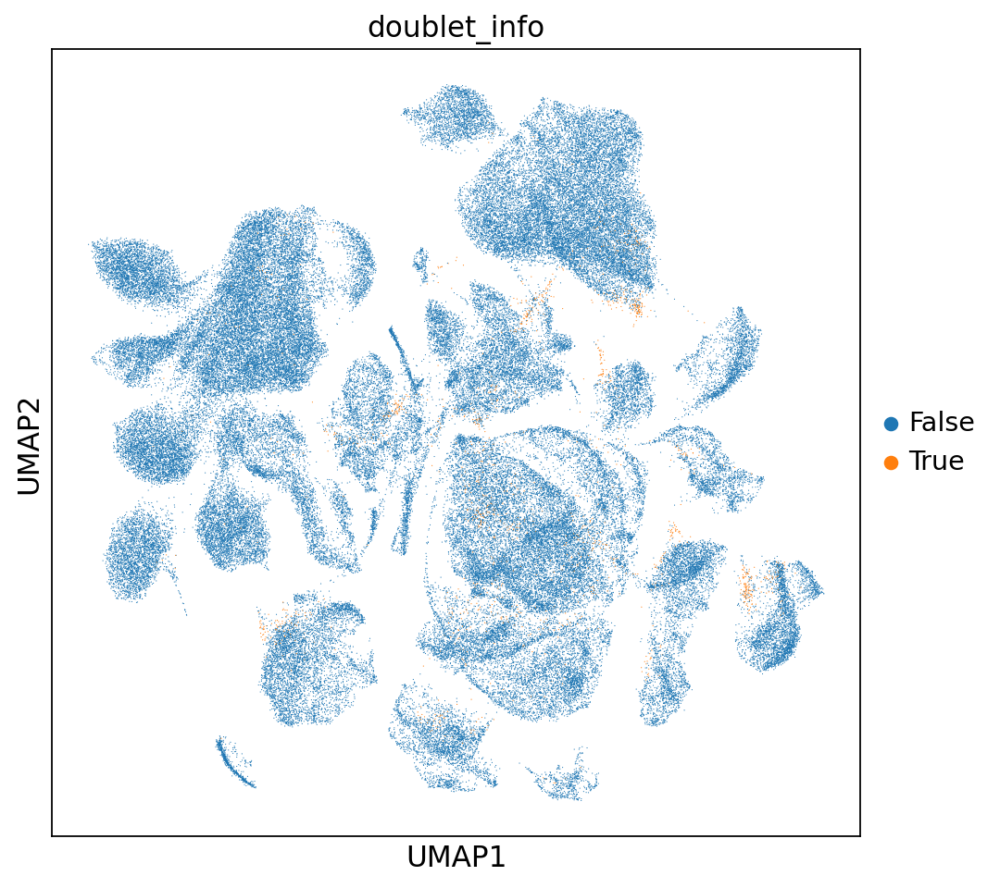

In [57]:
sc.pl.umap(adata, color=['doublet_info'])

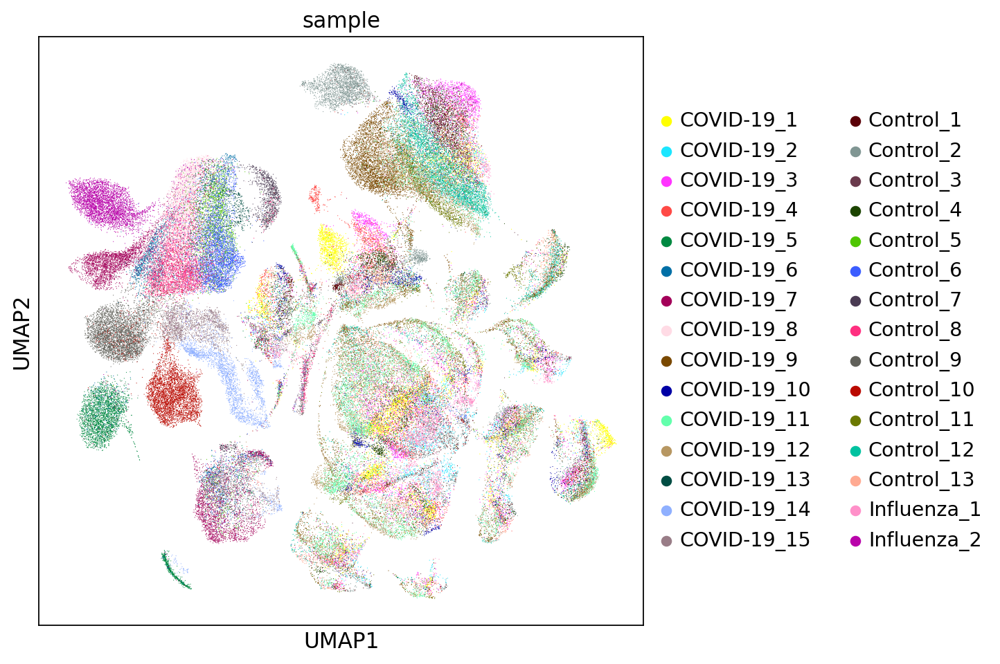

In [58]:
sc.pl.umap(adata, color=['sample'])

In [59]:
# # Save adata
# save_file = './data/h5ab_folder/gse159812_raw_covid_normalized_preprocessed.h5ad'
# adata.write_h5ad(save_file)

In [60]:
# adata = adata.copy()     #run this line if you get the "AttributeError: swapaxes not found" 

# regress out unwanted variables
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

# scale data, clip values exceeding standard deviation 10.
sc.pp.scale(adata, max_value=10)

regressing out ['total_counts', 'pct_counts_mt']
    finished (0:00:55)


In [61]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:10)


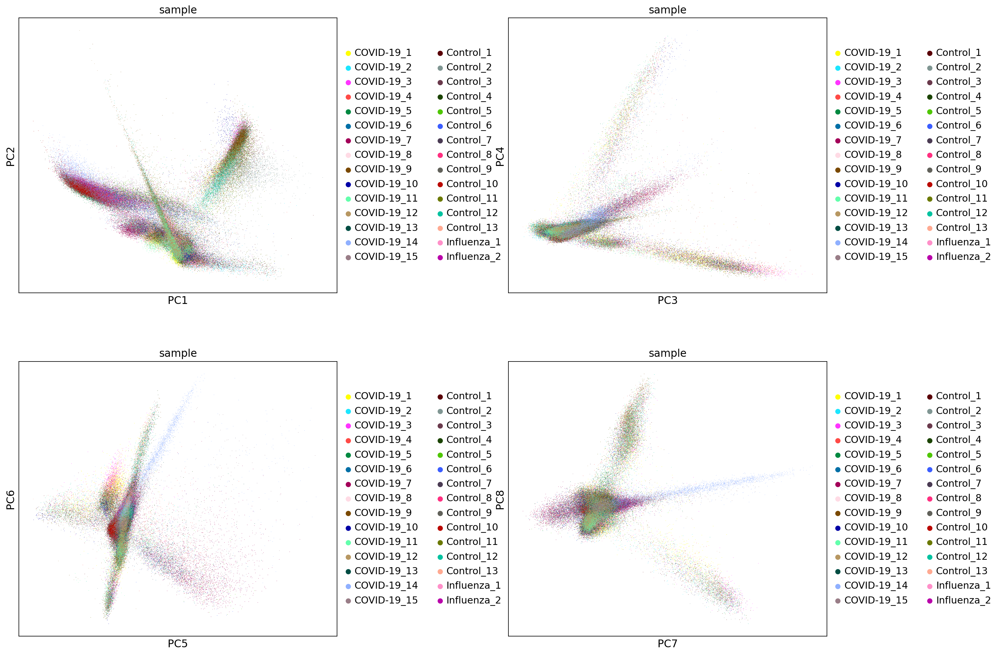

In [63]:
# plot more PCS
sc.pl.pca(adata, color='sample', components = ['1,2','3,4','5,6','7,8'], ncols=2, wspace=0.4)
# color: Keys for annotations of observations/cells or variables/genes


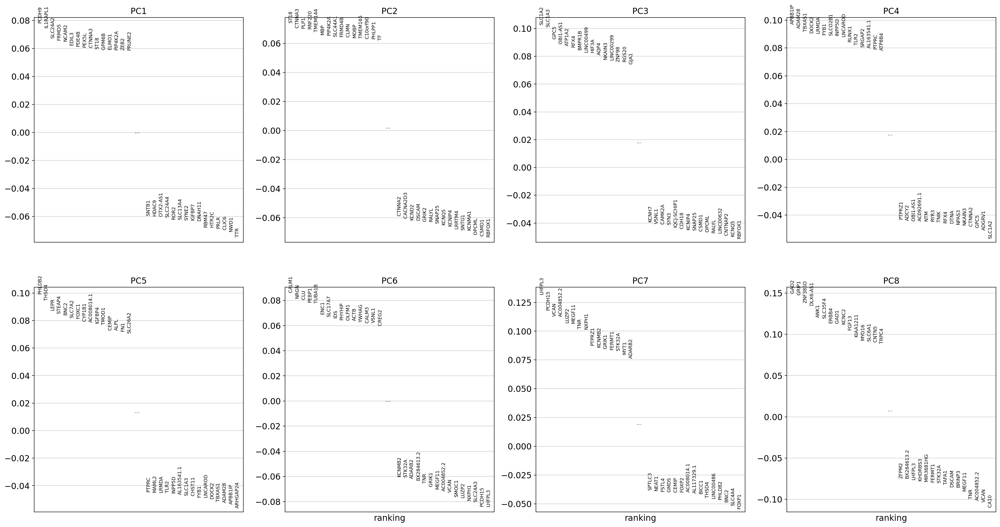

In [64]:
#Plot loadings
sc.pl.pca_loadings(adata, components=[1,2,3,4,5,6,7,8])

# OBS! only plots the positive axes genes from each PC!!


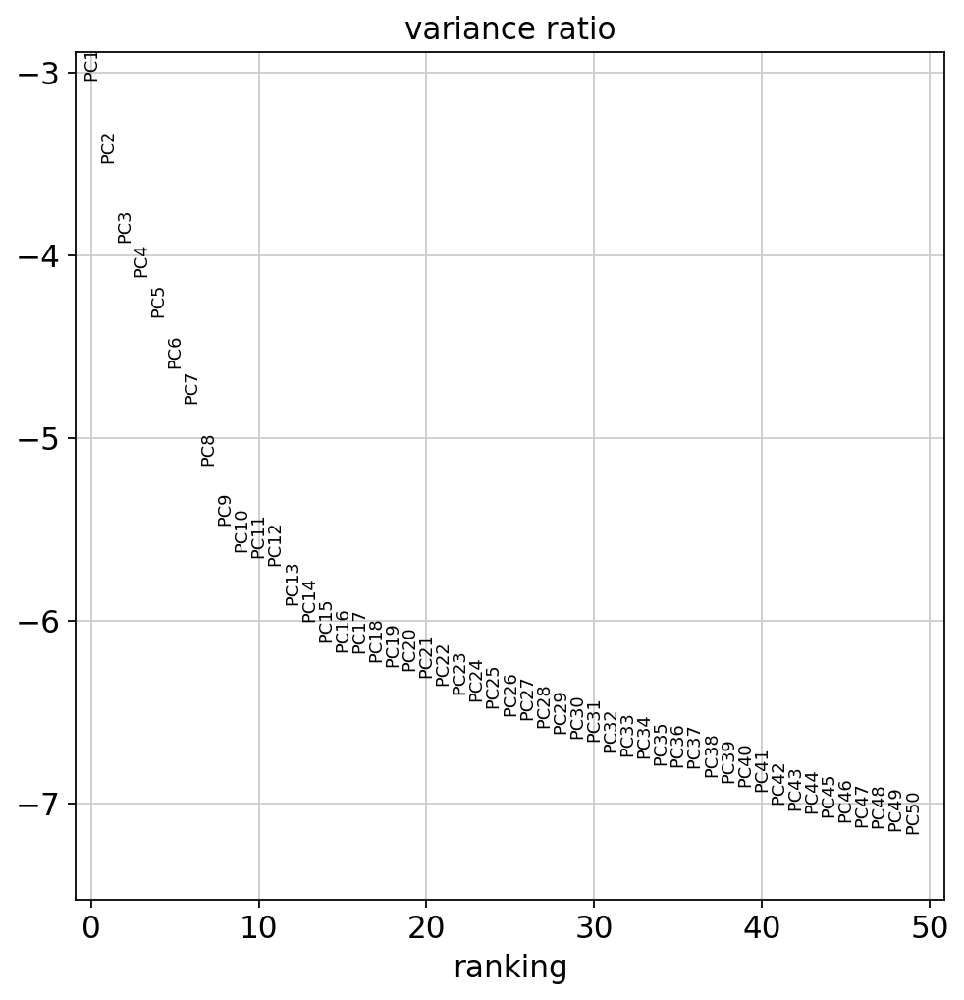

In [65]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs = 50)

In [66]:
sc.tl.tsne(adata, n_pcs = 30)

computing tSNE
    using 'X_pca' with n_pcs = 30
    using sklearn.manifold.TSNE
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
XX: None
YY: None
X

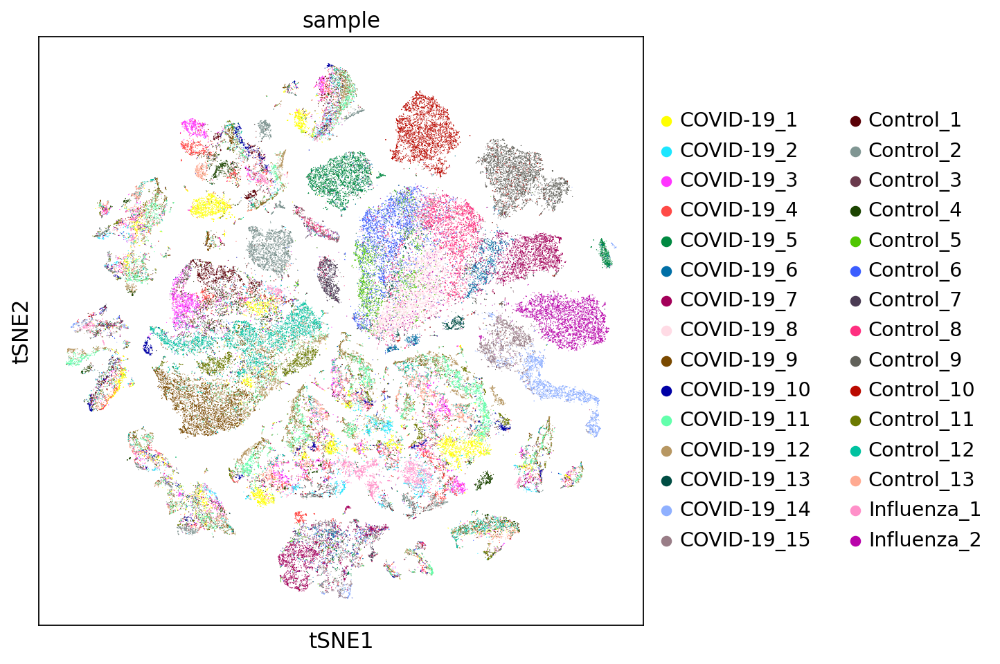

In [67]:
sc.pl.tsne(adata, color='sample')

In [68]:
sc.pp.neighbors(adata, n_pcs = 30, n_neighbors = 20) 

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:10)


In [69]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:51)


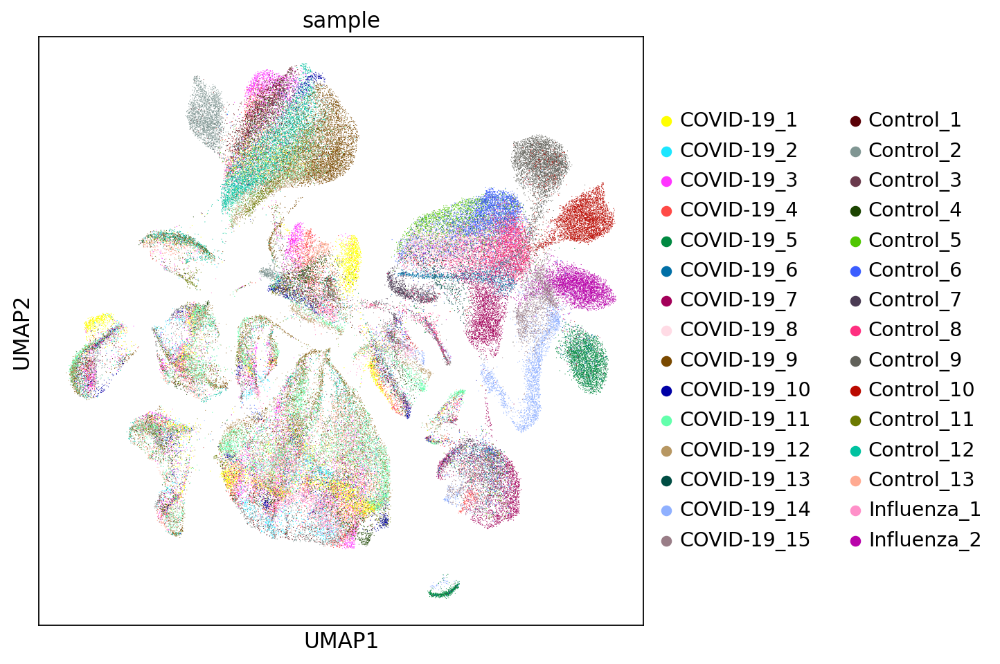

In [70]:
sc.pl.umap(adata, color='sample')

In [71]:
save_file = './data/h5ab_folder/gse159812_raw_covid_normalized_preprocessed.h5ad'
adata.write_h5ad(save_file)

## Sample Classification

### Input data
PCA representation (pca 1 - pca 15)

Train dataset:
covid_1, covid_15, ctrl_5, ctl_13
Test dataset:
covid_17, ctlr_14

### Classification model
Binary classification (covid or non_covid). <br>
• 'covid_" -> covid <br>
• "ctlr_" -> non_covid.

In [2]:
adata = sc.read_h5ad('./data/h5ab_folder/gse159812_raw_covid_normalized_preprocessed.h5ad')

In [3]:
adata.obs

,sample,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,percent_mt2,n_counts,n_genes,S_score,G2M_score,phase,doublet_scores,predicted_doublets,doublet_info
AAACCCAAGGCTTTCA,COVID-19_1,0,2089,3665.0,1.0,0.027285,11.0,0.300136,0.0,0.000000,NaN,3665.0,2089,-0.041944,0.004079,G2M,0.221875,False,False
AAACCCACAGGTATGG,COVID-19_1,0,1716,3132.0,1.0,0.031928,8.0,0.255428,0.0,0.000000,NaN,3132.0,1716,-0.028245,-0.055944,G1,0.018135,False,False
AAACCCATCGAGTACT,COVID-19_1,0,4228,9130.0,37.0,0.405257,34.0,0.372399,2.0,0.021906,NaN,9130.0,4228,-0.011416,-0.092075,G1,0.212274,False,False
AAACCCATCGTGGTAT,COVID-19_1,0,479,563.0,0.0,0.000000,4.0,0.710480,0.0,0.000000,NaN,563.0,479,-0.021918,-0.012821,G1,0.008351,False,False
AAACGAAAGAAGAACG,COVID-19_1,0,2468,4163.0,8.0,0.192169,35.0,0.840740,0.0,0.000000,NaN,4163.0,2468,0.003457,-0.023310,S,0.114469,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTCACAACGCC,COVID-19_15,29,3667,8992.0,181.0,2.012900,86.0,0.956406,2.0,0.022242,NaN,8992.0,3667,-0.095173,-0.006410,G1,0.071136,False,False
TTTGGTTGTACAAGCG,COVID-19_15,29,602,856.0,51.0,5.957944,6.0,0.700935,0.0,0.000000,NaN,856.0,602,-0.017808,0.011072,G2M,0.028046,False,False
TTTGTTGAGCCGTAAG,COVID-19_15,29,958,1469.0,131.0,8.917631,4.0,0.272294,1.0,0.068074,NaN,1469.0,958,-0.031507,-0.017483,G1,0.056483,False,False
TTTGTTGCAAGCGGAT,COVID-19_15,29,2297,5004.0,800.0,15.987210,35.0,0.699440,0.0,0.000000,NaN,5004.0,2297,-0.035943,-0.051865,G1,0.080871,False,False


In [4]:
list_samples = adata.obs['sample'].unique()

In [5]:
list_covid = ['COVID-19_9', 'COVID-19_1', 'COVID-19_11', 'COVID-19_8', 'COVID-19_3',
              'COVID-19_7', 'COVID-19_4', 'COVID-19_12', 'COVID-19_5', 'COVID-19_15',
               'COVID-19_14', 'COVID-19_2', 'COVID-19_6', 'COVID-19_10', 'COVID-19_13']
list_non_covid = ['Control_12', 'Control_2','Control_9', 'Influenza_2', 'Control_10',     
               'Control_13', 'Control_6', 'Control_11', 'Control_8', 'Control_7', 'Influenza_1',
               'Control_5', 'Control_4', 'Control_1', 'Control_3']

for index, row in adata.obs.iterrows():
     if row['sample'] in list_covid:
          new_value = 'covid'
     elif row['sample'] in list_non_covid:
          new_value = 'non_covid'

     adata.obs.at[index, 'covid_non_covid'] = new_value

In [6]:
#adata.obs.loc[adata.obs['sample']=='Control_2']

In [7]:
# Get the feature of PCA 1 and 2
pca_rep = adata.obsm['X_pca'][:, :15]
pca_rep.shape # number of cells * PCA1 & PCA2

(114701, 15)

In [8]:
df_obs = adata.obs

#list_samples = ['covid_1', 'covid_15', 'covid_17', 'ctrl_5', 'ctrl_13', 'ctrl_14']
sample_range = dict()
y = []
beginning = 0
for sample in list_samples:
    sample_range[sample] = [beginning, beginning+len(df_obs[df_obs['sample'] == sample].index.to_list())]
    beginning = len(df_obs[df_obs['sample'] == sample].index.to_list())+beginning

print(f'Sample range: {sample_range}')

Sample range: {'COVID-19_1': [0, 6685], 'COVID-19_2': [6685, 9044], 'COVID-19_3': [9044, 14893], 'COVID-19_4': [14893, 19454], 'Influenza_1': [19454, 22283], 'Control_1': [22283, 24741], 'Control_2': [24741, 29489], 'Control_3': [29489, 31830], 'Control_4': [31830, 34647], 'COVID-19_5': [34647, 38414], 'COVID-19_6': [38414, 40497], 'COVID-19_7': [40497, 45516], 'COVID-19_8': [45516, 49677], 'Influenza_2': [49677, 53955], 'Control_5': [53955, 56440], 'Control_6': [56440, 60434], 'Control_7': [60434, 61919], 'Control_8': [61919, 65436], 'Control_9': [65436, 70044], 'Control_10': [70044, 74305], 'Control_11': [74305, 78122], 'Control_12': [78122, 84928], 'Control_13': [84928, 89146], 'COVID-19_9': [89146, 95971], 'COVID-19_10': [95971, 97737], 'COVID-19_11': [97737, 103749], 'COVID-19_12': [103749, 108144], 'COVID-19_13': [108144, 108828], 'COVID-19_14': [108828, 111775], 'COVID-19_15': [111775, 114701]}


In [9]:
print("Num of covid samples",len(list_covid))
print("Num of non covid samples", len(list_non_covid))

Num of covid samples 15
Num of non covid samples 15


In [10]:
# list_covid = ['COVID-19_9', 'COVID-19_1', 'COVID-19_11', 'COVID-19_8', 'COVID-19_3',
#               'COVID-19_7', 'COVID-19_4', 'COVID-19_12', 'COVID-19_5', 'COVID-19_15',
#                'COVID-19_14', 'COVID-19_2', 'COVID-19_6', 'COVID-19_10', 'COVID-19_13']
# list_non_covid = ['Control_12', 'Control_2','Control_9', 'Influenza_2', 'Control_10',     
#                'Control_13', 'Control_6', 'Control_11', 'Control_8', 'Control_7', 'Influenza_1',
#                'Control_5', 'Control_4', 'Control_1', 'Control_3']

In [23]:
from sklearn.model_selection import train_test_split

y_train, y_test = train_test_split(list_samples, test_size=0.20, random_state=42)

In [24]:
print(len(y_train))
print(len(y_test))

24
6


In [25]:
y_train

['COVID-19_14', 'COVID-19_10', 'COVID-19_8', 'COVID-19_1', 'Influenza_1', ..., 'Control_3', 'COVID-19_6', 'Control_5', 'Control_10', 'Control_2']
Length: 24
Categories (30, object): ['COVID-19_1', 'COVID-19_2', 'COVID-19_3', 'COVID-19_4', ..., 'Control_12', 'Control_13', 'Influenza_1', 'Influenza_2']

In [26]:
y_test

['COVID-19_13', 'Control_6', 'COVID-19_9', 'Control_8', 'Control_4', 'COVID-19_5']
Categories (30, object): ['COVID-19_1', 'COVID-19_2', 'COVID-19_3', 'COVID-19_4', ..., 'Control_12', 'Control_13', 'Influenza_1', 'Influenza_2']

In [27]:
sample_range

{'COVID-19_1': [0, 6685],
 'COVID-19_2': [6685, 9044],
 'COVID-19_3': [9044, 14893],
 'COVID-19_4': [14893, 19454],
 'Influenza_1': [19454, 22283],
 'Control_1': [22283, 24741],
 'Control_2': [24741, 29489],
 'Control_3': [29489, 31830],
 'Control_4': [31830, 34647],
 'COVID-19_5': [34647, 38414],
 'COVID-19_6': [38414, 40497],
 'COVID-19_7': [40497, 45516],
 'COVID-19_8': [45516, 49677],
 'Influenza_2': [49677, 53955],
 'Control_5': [53955, 56440],
 'Control_6': [56440, 60434],
 'Control_7': [60434, 61919],
 'Control_8': [61919, 65436],
 'Control_9': [65436, 70044],
 'Control_10': [70044, 74305],
 'Control_11': [74305, 78122],
 'Control_12': [78122, 84928],
 'Control_13': [84928, 89146],
 'COVID-19_9': [89146, 95971],
 'COVID-19_10': [95971, 97737],
 'COVID-19_11': [97737, 103749],
 'COVID-19_12': [103749, 108144],
 'COVID-19_13': [108144, 108828],
 'COVID-19_14': [108828, 111775],
 'COVID-19_15': [111775, 114701]}

In [28]:
train_sample = y_train
np.random.shuffle(train_sample)

test_sample = y_test
X_train = []
y_train = []
X_test = []
y_test = []
y_test_sample_range = dict()
begin = 0

sample_covid_count = 0
#sample_non_covid_count = 0
for sample, list_range in sample_range.items():
    if sample in train_sample:
        for i in range(list_range[0], list_range[1]):
            X_train.append(pca_rep[i])
            if 'COVID' in sample:
                y_train.append('covid')
            else:
                y_train.append('non_covid')
    else:
        for i in range(list_range[0], list_range[1]):
            X_test.append(pca_rep[i])
            if 'COVID' in sample:
                y_test.append('covid')
                s = 'covid'
                #sample_covid_count += 1
                #sample_with_count = f"{sample}_{sample_covid_count}"
            else:
                y_test.append('non_covid')
                s = 'non_covid'
                #sample_non_covid_count += 1
                #sample_with_count = f"{sample}_{sample_non_covid_count}"
        y_test_sample_range[sample] = sample_range[sample]
        #begin = len(y_test)

In [29]:
y_test_sample_range

{'Control_4': [31830, 34647],
 'COVID-19_5': [34647, 38414],
 'Control_6': [56440, 60434],
 'Control_8': [61919, 65436],
 'COVID-19_9': [89146, 95971],
 'COVID-19_13': [108144, 108828]}

In [30]:
print(np.array(X_train).shape)
print(np.array(X_test).shape)
print(np.array(y_train).shape)
print(np.array(y_test).shape)

(93097, 15)
(21604, 15)
(93097,)
(21604,)


In [20]:
# # Import train_test_split function
from sklearn.model_selection import train_test_split

# Split dataset into training set and test set
# X_train, _, y_train, _ = train_test_split(X_train, y_train, test_size=0,random_state=10) # 80% training and 20% test
from sklearn.utils import shuffle
X_train, y_train = shuffle(X_train, y_train, random_state=10)

print(f"Number of train data: {len(X_train)}")
print(f"Number of test data: {len(X_test)}")

Number of train data: 0
Number of test data: 114701


In [44]:
y_train

['covid',
 'covid',
 'non_covid',
 'covid',
 'covid',
 'non_covid',
 'non_covid',
 'covid',
 'covid',
 'non_covid',
 'non_covid',
 'non_covid',
 'covid',
 'non_covid',
 'covid',
 'covid',
 'non_covid',
 'non_covid',
 'covid',
 'covid',
 'covid',
 'covid',
 'covid',
 'non_covid',
 'non_covid',
 'non_covid',
 'non_covid',
 'non_covid',
 'covid',
 'covid',
 'non_covid',
 'non_covid',
 'covid',
 'non_covid',
 'non_covid',
 'covid',
 'covid',
 'non_covid',
 'non_covid',
 'non_covid',
 'non_covid',
 'covid',
 'non_covid',
 'covid',
 'covid',
 'non_covid',
 'non_covid',
 'covid',
 'non_covid',
 'covid',
 'non_covid',
 'covid',
 'covid',
 'covid',
 'covid',
 'non_covid',
 'covid',
 'non_covid',
 'covid',
 'non_covid',
 'covid',
 'non_covid',
 'non_covid',
 'covid',
 'non_covid',
 'covid',
 'non_covid',
 'non_covid',
 'non_covid',
 'non_covid',
 'non_covid',
 'non_covid',
 'covid',
 'non_covid',
 'covid',
 'non_covid',
 'covid',
 'non_covid',
 'non_covid',
 'non_covid',
 'non_covid',
 'covid',


In [45]:
#Import svm model
from sklearn import svm

#Create a svm Classifier
clf = svm.SVC(kernel='linear') # Linear Kernel

#Train the model using the training sets
clf.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

SVC(kernel='linear')

In [46]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics

# Model Accuracy: how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

# Model Precision: what percentage of positive tuples are labeled as such?
print("Precision:",metrics.precision_score(y_test, y_pred,  average='micro'))

# Model Recall: what percentage of positive tuples are labelled as such?
print("Recall:",metrics.recall_score(y_test, y_pred, average='micro'))

Accuracy: 0.5078226254397333
Precision: 0.5078226254397333
Recall: 0.5078226254397333


In [53]:
# Count the predicted labels for each data point (x, y), then get the label which has the most count.
for sample, r in y_test_sample_range.items():
    unique, counts = np.unique(y_pred[r[0]: r[1]], return_counts=True)
    print(np.asarray((unique, counts)).T)
    pred_label = unique[np.where(counts == counts.max())[0]]
    print("Predicted label:", pred_label[0])
        

[['covid' '3304']
 ['non_covid' '3381']]
Predicted label: non_covid
[['covid' '938']
 ['non_covid' '1421']]
Predicted label: non_covid
[['covid' '2190']
 ['non_covid' '3659']]
Predicted label: non_covid
[['covid' '1544']
 ['non_covid' '3017']]
Predicted label: non_covid
[['covid' '1011']
 ['non_covid' '1139']]
Predicted label: non_covid
[]


ValueError: zero-size array to reduction operation maximum which has no identity